## Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
from skimage import io
import cv2
from sklearn.model_selection import train_test_split, KFold
from sklearn.utils import shuffle
from scipy.io import loadmat

import tensorflow
from tensorflow import keras
from tensorflow import cast
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import AUC
from tensorflow.keras.applications import vgg16
from keras.utils.vis_utils import plot_model

import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,f1_score, confusion_matrix
import gc
import os

## Mounting Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Image Pre-Processing

In [ ]:
IMAGE_HEIGHT=256
IMAGE_WIDTH=256
SAVE_MODEL_PATH = "/content/drive/MyDrive/CV/models/"
SAVE_FILE_PATH = "/content/drive/MyDrive/CV/model_plots/"

In [ ]:
x_train = np.load('/content/drive/MyDrive/CV/train_images.npy')
y_train = np.load('/content/drive/MyDrive/CV/train_labels.npy', allow_pickle=True)
x_test = np.load('/content/drive/MyDrive/CV/test_images.npy')
y_test = np.load('/content/drive/MyDrive/CV/test_labels.npy', allow_pickle=True)

In [ ]:
label_name = pd.read_csv('/content/drive/MyDrive/CV/label_names.csv', names=['classes'])
label_name = label_name.values[:, 0]

In [ ]:
label_name[0]

'person'

In [ ]:
freq = np.sum(y_train, axis=0)

In [ ]:
np.sum(y_train, axis=0), freq

(array([2479.,  122.,  477.,  147.,  136.,  156.,  134.,  246.,  108.,
         163.,  204.,  126.,  161.,  166.,  108.,   97.,  192.,  169.,
         256.,  163.,  116.,  166.,   99.,  110.,  135.,  134.,  137.,
         307.,  330.,  125.,  150.,  108.,  253.,  128.,  104.,  487.,
         164.,  183.,  151.,  426.,  122.,  161.,  132.,  115.,   93.,
         173.,   93.,  168.,  212.,  194.,  143.], dtype=float32),
 array([2479.,  122.,  477.,  147.,  136.,  156.,  134.,  246.,  108.,
         163.,  204.,  126.,  161.,  166.,  108.,   97.,  192.,  169.,
         256.,  163.,  116.,  166.,   99.,  110.,  135.,  134.,  137.,
         307.,  330.,  125.,  150.,  108.,  253.,  128.,  104.,  487.,
         164.,  183.,  151.,  426.,  122.,  161.,  132.,  115.,   93.,
         173.,   93.,  168.,  212.,  194.,  143.], dtype=float32))

In [ ]:
y_train.shape, freq.shape

((4500, 51), (51,))

In [ ]:
y_test.shape

(500, 51)

# Creating Neural Networks


In [ ]:
'''
function to get the head model for our model
can use VGG16, InceptionV3, ResNet152V2 or NAS Net Large
by default we will use pretrained weights from ImageNet dataset
'''
def getBaseModel(modelName, pretrained=True):
    if modelName == "VGG16":
        if pretrained:
            baseModel = VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = VGG16(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    elif modelName == "InceptionV3":
        if pretrained:
            baseModel = InceptionV3(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = InceptionV3(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    elif modelName == "InceptionResNetV2":
        if pretrained:
            baseModel = InceptionResNetV2(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = InceptionResNetV2(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    elif modelName == "NasNetLarge":
        if pretrained:
            baseModel = NasNetLarge(include_top=False, weights="imagenet", input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
        else:
            baseModel = NasNetLarge(include_top=False, input_tensor=Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    else:
        raise Exception("Model not supported.")

    return baseModel

In [ ]:
'''
function to generate the model
gets the desired base model from modelName
adds a dropout of 0.6 after flatten 
the last layer wull contain num_classes no. of units
denseUnits contain the list of units - (length of denseUnits is the no. of 
dense layers we want to add with value at each index signifying no. of units in each layer)
'''
def generateModel(modelName, pretrained=True, dropout=0.5, num_classes=51, denseUnits=[256]):
    baseModel = getBaseModel(modelName, pretrained)

    # the output of baseModel
    headModel = baseModel.output

    # Adding trainable layers in front
    headModel = Flatten(name="flatten")(headModel)
    headModel = Dropout(dropout)(headModel)
    for i in denseUnits:
        headModel = Dense(i, activation="relu")(headModel)

    # using sigmoid in last layer because output is multi-label
    headModel = Dense(num_classes, activation="sigmoid")(headModel)
    
    # Use pretrained weights
    if pretrained:
        for layer in baseModel.layers:
            layer.trainable = False
    model = Model(inputs=baseModel.input, outputs=headModel)
    fileName = SAVE_FILE_PATH + "model_plot_" + modelName + ".png"
    plot_model(model, to_file=fileName, show_shapes=True, show_layer_names=True)
    return model

In [ ]:
'''
function to train the model - uses Adam as optimizer and binary crossentropy as loss function
x, y - training data and labels
lrate - learning rate for Adam
epochs - no. of epochs
model - the model to train
modelName - the name of the model (for saving purposes)
class_weights - the weights for each class
earlyStopping - whether to use EarlyStopping callback or not
'''
def train(x, y, lrate, batch_size, epochs, model, modelName, class_weights, earlyStopping=True):
    optimizer = Adam(learning_rate=lrate)
    model.compile(optimizer=optimizer,
                    loss="binary_crossentropy",
                    metrics=[AUC(multi_label=True), keras.metrics.Precision(), keras.metrics.Recall()])
    
    #model save at checkpoint callback
    checkpoint = ModelCheckpoint(os.path.join(SAVE_MODEL_PATH, modelName), monitor= 'recall', mode= 'max', save_best_only=True, save_weights_only=True, verbose= 1)

    #early stopping callback
    if earlyStopping:
        es_cb = EarlyStopping(monitor='loss', mode='min', verbose=1, patience=10, restore_best_weights=True)
        history = model.fit(x=x, y=y, epochs=epochs, class_weight=class_weights, batch_size=batch_size, verbose=1, callback=[es_cb])
    else:
        history = model.fit(x=x, y=y, epochs=epochs, class_weight=class_weights,batch_size=batch_size, verbose=1)
    
    keras.backend.clear_session()
    gc.collect()
    model.save(os.path.join(SAVE_MODEL_PATH,"finalModel" + modelName + ".h5"))
    del model
    return history

In [ ]:
np.sum(y_train,axis=0)/np.sum(y_test,axis=0)

array([9.014545 , 6.7777777, 8.672728 , 8.6470585, 9.066667 , 9.176471 ,
       8.933333 , 9.111111 , 9.       , 9.055555 , 8.869565 , 9.       ,
       8.05     , 9.222222 , 9.       , 8.818182 , 8.727273 , 8.894737 ,
       8.533334 , 9.055555 , 8.923077 , 9.222222 , 9.       , 8.461538 ,
       9.       , 8.375    , 9.133333 , 7.8717947, 8.918919 , 8.928572 ,
       8.823529 , 7.2      , 8.724138 , 8.533334 , 7.428571 , 7.9836063,
       8.2      , 9.15     , 8.388889 , 9.063829 , 8.714286 , 8.944445 ,
       6.9473686, 7.1875   , 6.2      , 8.65     , 9.3      , 7.304348 ,
       7.571429 , 9.238095 , 8.9375   ], dtype=float32)

In [ ]:
# Using VGG-16
x_train = vgg16.preprocess_input(x_train)
model = generateModel("VGG16", dropout=0.6, num_classes=51, denseUnits=[256])
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0   

# Class Weights

In [ ]:
# class weights 
class_weights = {}
for i in range(y_train.shape[1]):
    # class weights = 1/sqrt(frequency of class)
    val = np.sum(y_train, axis=0)[i]
    class_weights[i] = 1/(np.sqrt(val))

# reducing the weight for person class
class_weights[0] *= 0.5
class_weights

{0: 0.010042266209236046,
 1: 0.09053574974745077,
 2: 0.04578685369346279,
 3: 0.08247861217552505,
 4: 0.08574929557377618,
 5: 0.08006407716136342,
 6: 0.08638684082287697,
 7: 0.0637576710393699,
 8: 0.09622504879958661,
 9: 0.07832604609047276,
 10: 0.07001400378896204,
 11: 0.08908708372542402,
 12: 0.07881103993118946,
 13: 0.07761505088432184,
 14: 0.09622504879958661,
 15: 0.10153461571086121,
 16: 0.07216878494400528,
 17: 0.07692307692307693,
 18: 0.0625,
 19: 0.07832604609047276,
 20: 0.09284767028564815,
 21: 0.07761505088432184,
 22: 0.1005037860391621,
 23: 0.09534625777831769,
 24: 0.08606629768227989,
 25: 0.08638684082287697,
 26: 0.08543576865067794,
 27: 0.05707301376358713,
 28: 0.05504819110632702,
 29: 0.0894427196941238,
 30: 0.08164965671085447,
 31: 0.09622504879958661,
 32: 0.06286946247717587,
 33: 0.0883883491610206,
 34: 0.09805806730288975,
 35: 0.045314324217711484,
 36: 0.07808687978582586,
 37: 0.0739221281713273,
 38: 0.08137884340678914,
 39: 0.04845

# Training

In [ ]:
# epochs, learning rate and batch-size for training
epochs = 40
lrate = 1e-3
batch_size = 128

history = train(x_train, y_train, lrate, batch_size, epochs, model, "VGG16", class_weights, earlyStopping=False)

Epoch 1/40
36/36 [==============================] - 96s 1s/step - loss: 0.0771 - auc: 0.5924 - precision: 0.2357 - recall: 0.2782
Epoch 2/40
36/36 [==============================] - 51s 1s/step - loss: 0.0215 - auc: 0.7052 - precision: 0.4765 - recall: 0.4275
Epoch 3/40
36/36 [==============================] - 51s 1s/step - loss: 0.0143 - auc: 0.7594 - precision: 0.5396 - recall: 0.5039
Epoch 4/40
36/36 [==============================] - 51s 1s/step - loss: 0.0111 - auc: 0.7890 - precision: 0.6002 - recall: 0.5517
Epoch 5/40
36/36 [==============================] - 51s 1s/step - loss: 0.0092 - auc: 0.8068 - precision: 0.6343 - recall: 0.5882
Epoch 6/40
36/36 [==============================] - 52s 1s/step - loss: 0.0072 - auc: 0.8373 - precision: 0.6754 - recall: 0.6373
Epoch 7/40
36/36 [==============================] - 52s 1s/step - loss: 0.0064 - auc: 0.8427 - precision: 0.6919 - recall: 0.6481
Epoch 8/40
36/36 [==============================] - 52s 1s/step - loss: 0.0059 - auc: 0.85

# Testing and Metrics

In [ ]:
# the function to plot metrics
def plotMetrics(history):
    plt.plot(history["auc"])
    plt.plot(history["precision"])
    plt.plot(history["recall"])
    plt.title("Model Accuracy")
    plt.xlabel("epoch")
    plt.ylabel("metric")
    plt.legend(["AUC","Precision", "Recall"], loc="best")
    plt.show()

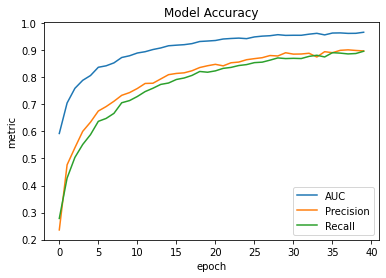

In [ ]:
plotMetrics(history.history)

In [ ]:
# model.load_weights('/content/drive/MyDrive/CV/models/finalModelVGG16.h5')

In [ ]:
# function to get the label from prediction
# based on the confidence the prediction is made
def getLabels(preds, confidence):
  result = []
  for pred in preds:
    res = []
    for i, prob in enumerate(pred):
      # predicted probability should be greater than confidence value to include in final re
      if prob > confidence:
          res.append(label_name[i])
    result.append(res)
  return result

In [ ]:
# preprocessing the test data
test_pred = model.predict(vgg16.preprocess_input(np.array(x_test,dtype=np.float32)))

In [ ]:
# metrics obtained for test data
optimizer = Adam(learning_rate=lrate)
model.compile(metrics=[AUC(multi_label=True), keras.metrics.Precision(), keras.metrics.Recall()])
eval = model.evaluate(vgg16.preprocess_input(np.array(x_test,dtype=np.float32)), y_test)

16/16 [==============================] - 7s 377ms/step - loss: 0.0000e+00 - auc: 0.6636 - precision: 0.6416 - recall: 0.4068


In [ ]:
gc.collect()

3396

In [ ]:
# function to diplay results for training data, confidence set to 0.5
def show_result_train(idx, conf=0.5):
    plt.imshow(x_org[idx].astype(np.uint8))
    print(getLabels(train_pred, conf)[idx])

# function to diplay results for testing data, confidence set to 0.5
def show_result_test(idx, conf=0.5):
    plt.imshow(x_test[idx].astype(np.uint8))
    print(getLabels(test_pred, conf)[idx])

# Testing on 100 random images

In [ ]:
import random
ran_nums = random.sample(range(500), 100)

['person']


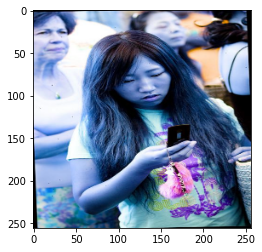

['person']


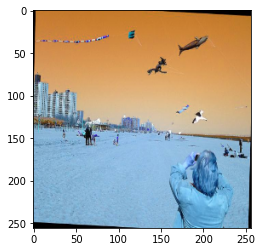

['person', 'cat']


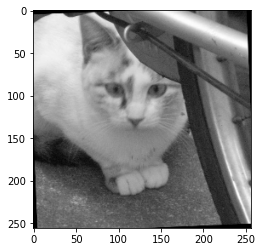

['person', 'car']


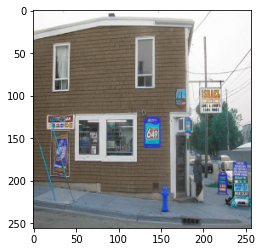

['person']


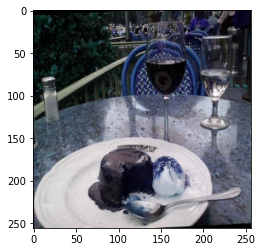

['chair', 'couch', 'tv', 'laptop', 'remote', 'book']


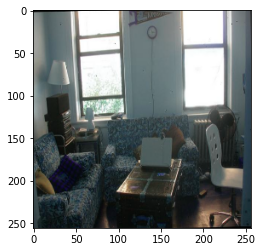

['person']


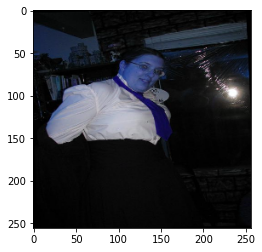

['person', 'tie']


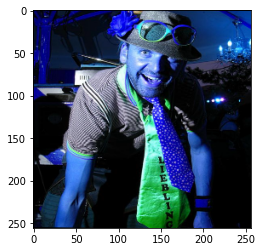

['person', 'bottle', 'cup']


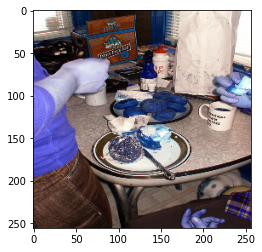

['person', 'bench']


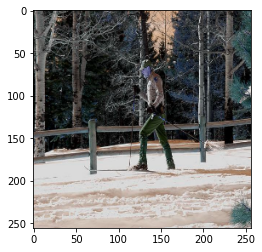

['person', 'skis']


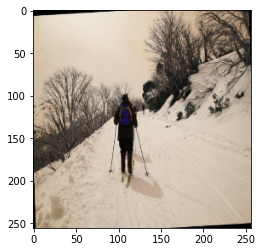

['bottle', 'sink']


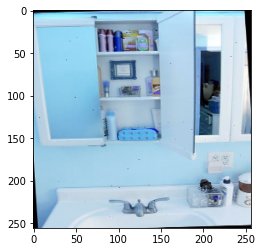

['person', 'chair']


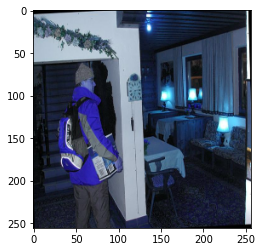

['bird']


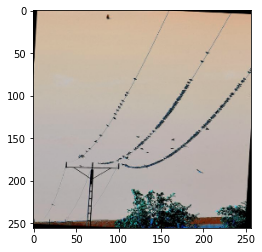

[]


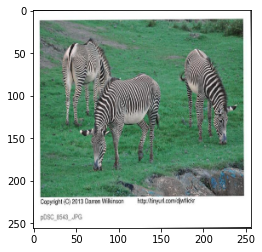

['person']


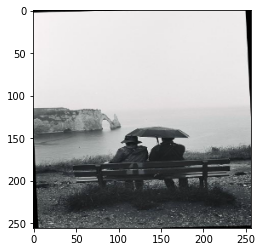

['person']


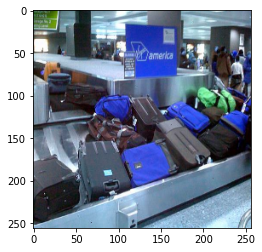

['person', 'car']


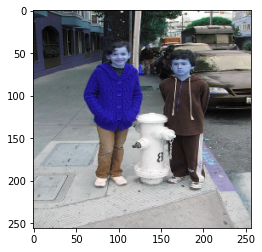

['person', 'car', 'motorcycle']


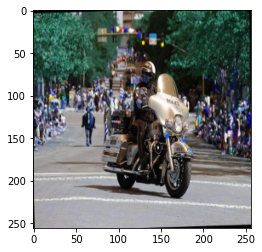

['cup']


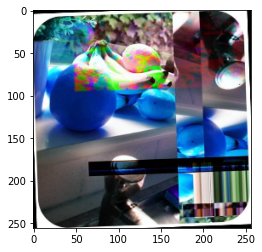

['cup']


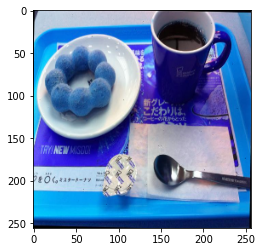

[]


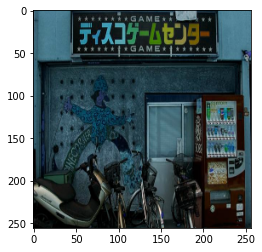

['cat']


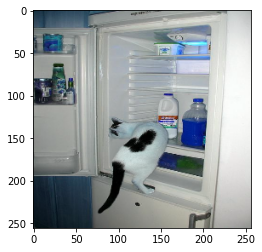

[]


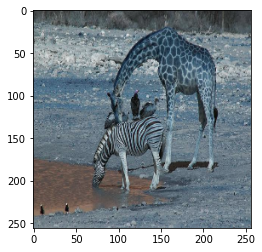

['person', 'truck']


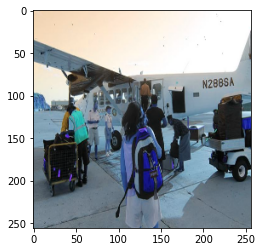

[]


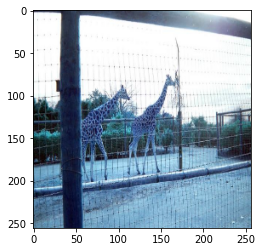

['person']


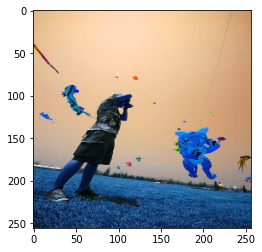

['person', 'potted plant', 'book']


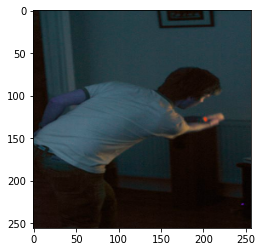

['person', 'surfboard']


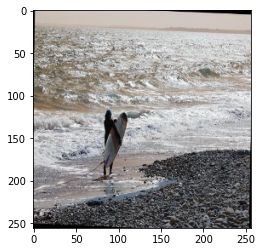

['train']


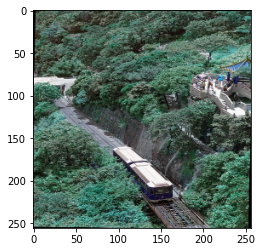

['car', 'clock']


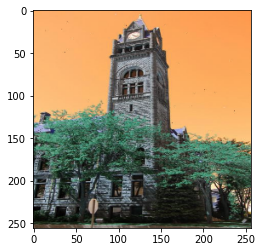

['handbag']


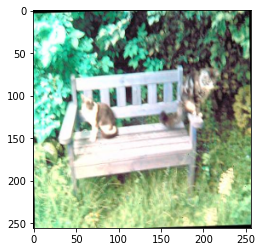

['person', 'bench', 'backpack']


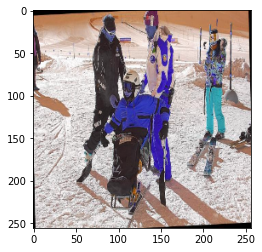

['person']


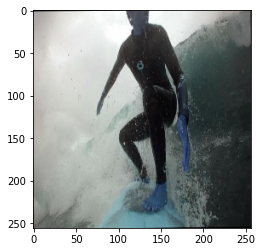

['giraffe']


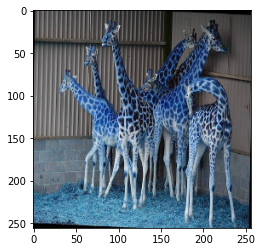

['person', 'baseball glove']


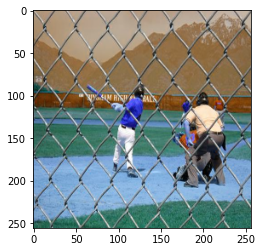

['cup', 'fork', 'bowl', 'dining table']


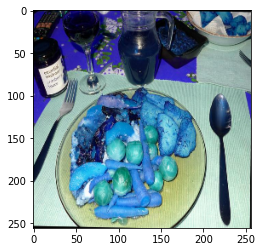

['person', 'car']


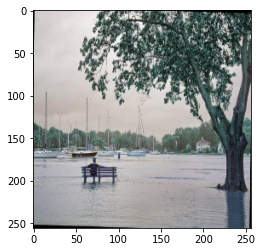

['sink']


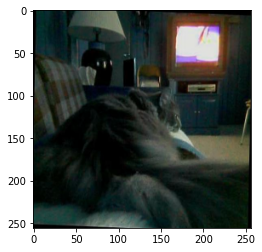

['person']


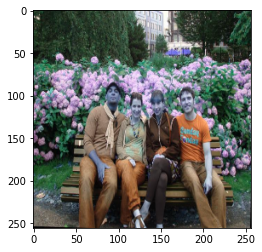

['person']


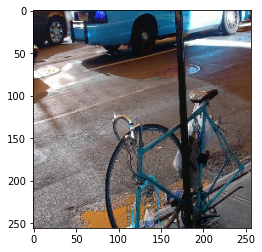

['person']


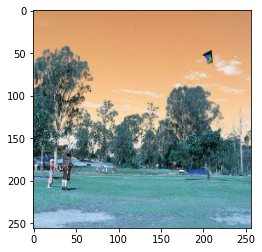

['person', 'tie']


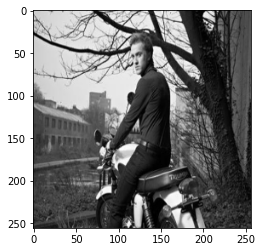

['clock']


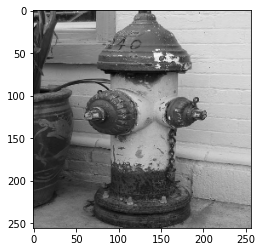

['person', 'cup', 'bowl', 'cake', 'dining table']


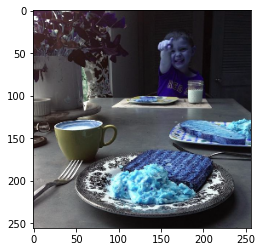

['toilet']


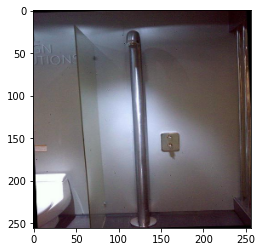

[]


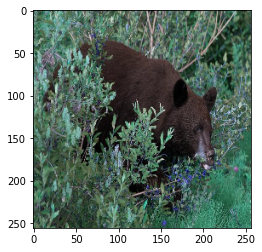

['person', 'car', 'bus', 'truck']


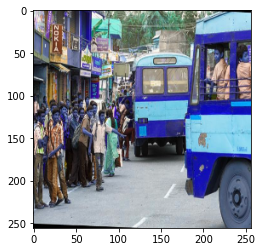

['person']


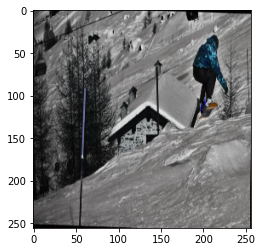

['airplane']


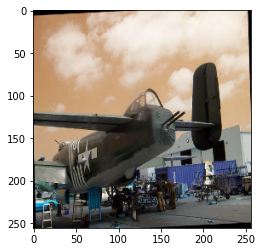

['person', 'laptop']


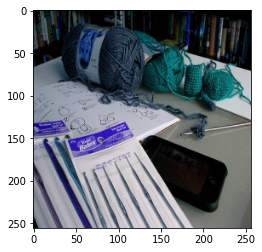

['person', 'truck', 'bottle', 'cup', 'knife', 'spoon', 'bowl', 'chair', 'dining table', 'oven', 'sink']


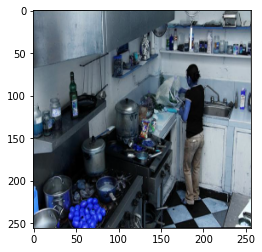

['person', 'car', 'umbrella']


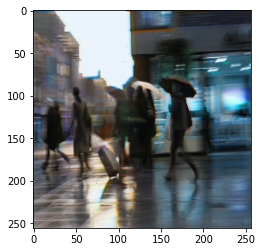

['cup']


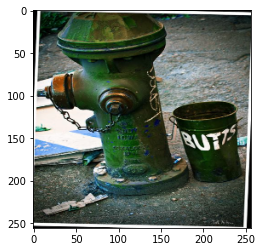

['person', 'bottle', 'dining table']


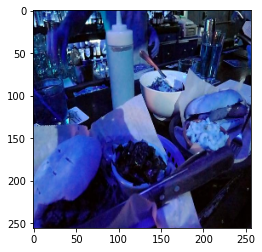

[]


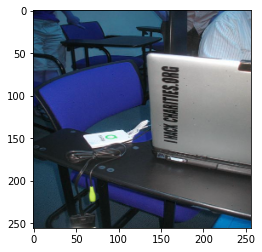

['person', 'airplane']


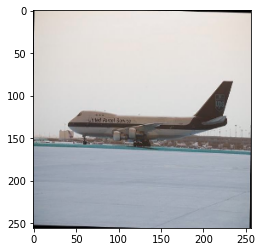

[]


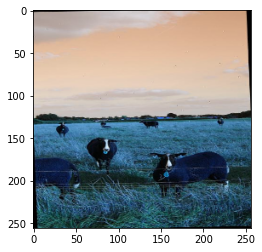

['person']


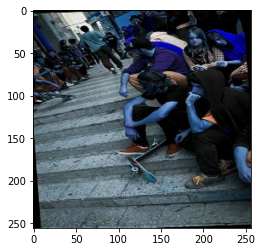

['person', 'dog']


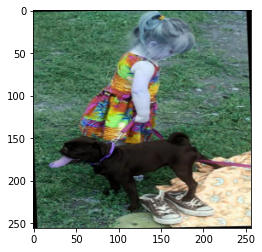

['person', 'chair']


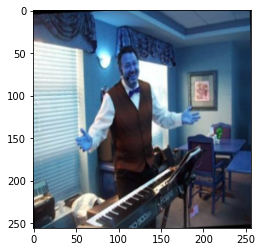

['person']


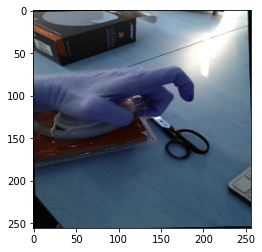

[]


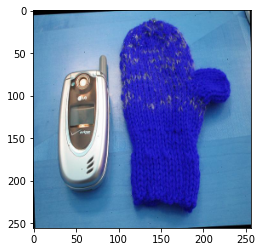

['car', 'truck']


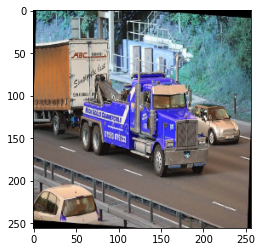

['person']


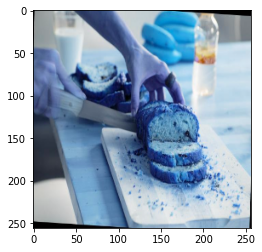

['bowl']


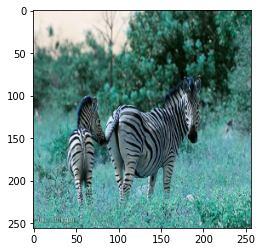

['person']


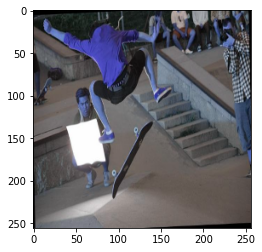

['chair']


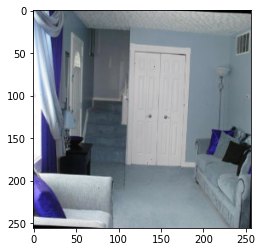

['cat']


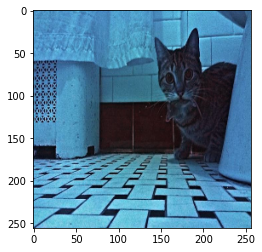

[]


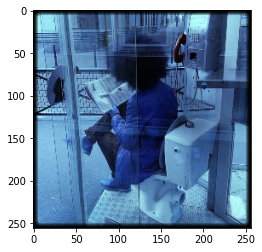

['person', 'car']


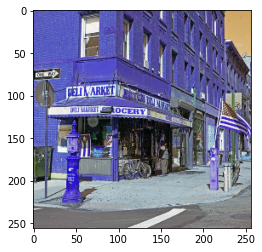

['person', 'backpack', 'skis']


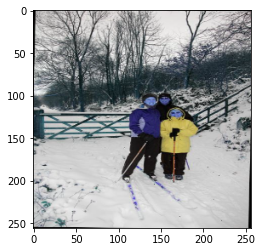

['person', 'car', 'train', 'boat', 'traffic light']


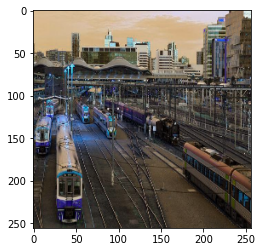

['oven', 'sink']


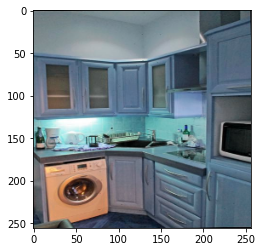

['person', 'bottle']


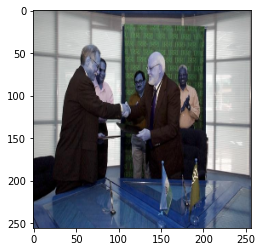

[]


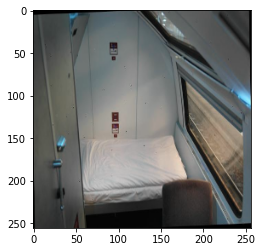

['person', 'chair', 'sink']


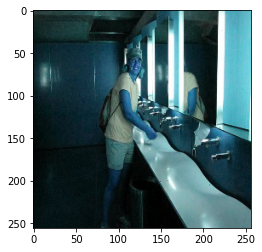

['person', 'car', 'clock']


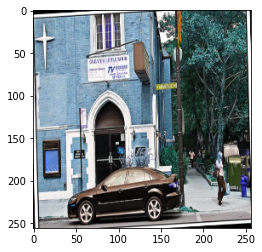

['cat']


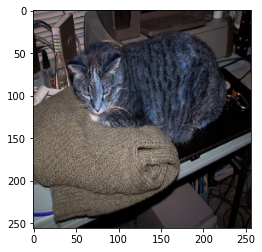

['person', 'skateboard']


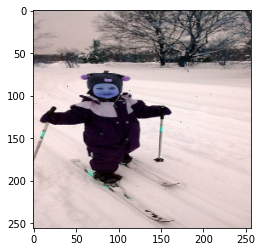

['person', 'umbrella']


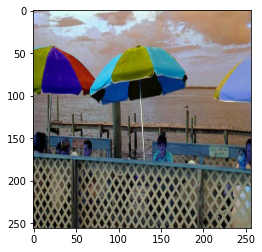

['person', 'tie']


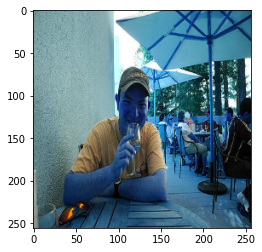

['bowl']


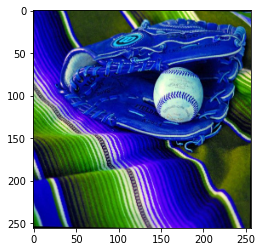

[]


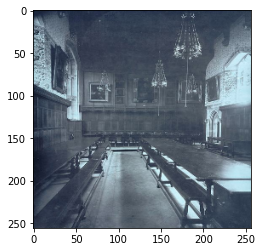

['person', 'cup', 'fork', 'spoon', 'bowl', 'chair', 'couch', 'potted plant', 'dining table', 'sink']


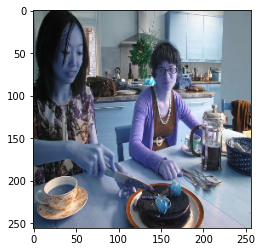

['car']


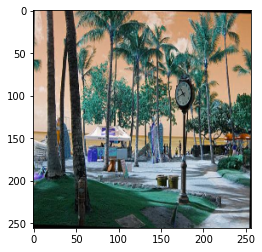

['bowl']


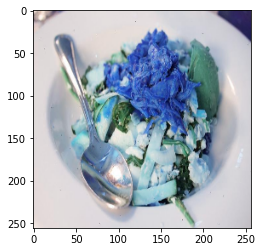

['person', 'car', 'bus']


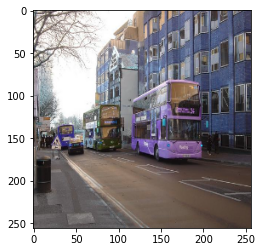

['bus', 'truck']


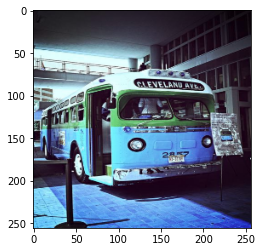

['person', 'bench']


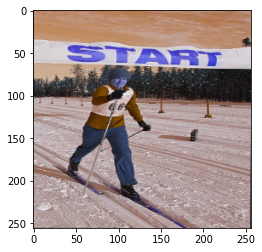

['person', 'baseball glove']


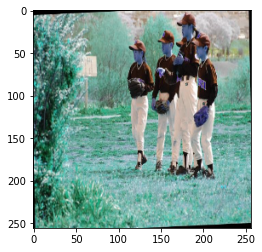

[]


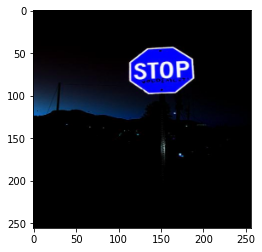

['person']


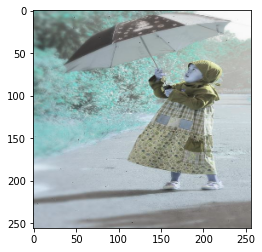

[]


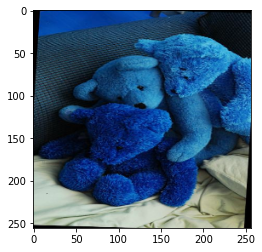

['cup', 'bowl']


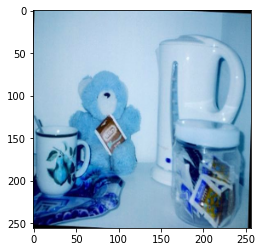

[]


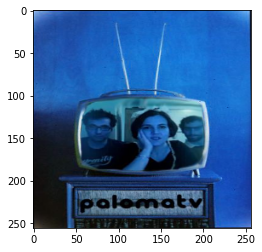

[]


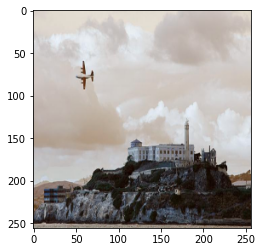

['dining table']


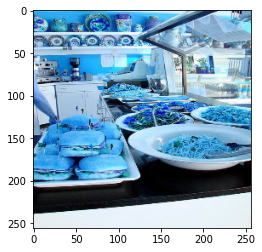

[]


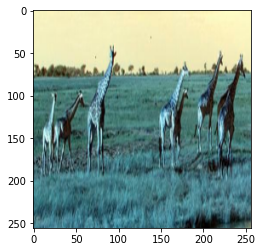

['cup', 'sink']


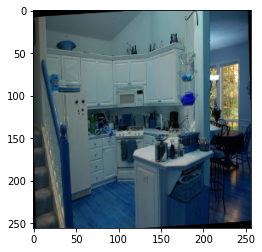

In [ ]:
for i in ran_nums:
  show_result_test(i)
  plt.show()

In [ ]:
show_result_test(1)

In [ ]:
show_result_test(5)

In [ ]:
show_result_test(11)

In [ ]:
show_result_test(53)

In [ ]:
show_result_test(16)

In [ ]:
show_result_test(56)

In [ ]:
x_test.shape

In [ ]:
show_result_test(150)